In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/fusion/final data/CT/p18/ct.jpg
/kaggle/input/fusion/final data/CT/p34/ct.jpg
/kaggle/input/fusion/final data/CT/p17/ct.jpg
/kaggle/input/fusion/final data/CT/p36/ct.jpg
/kaggle/input/fusion/final data/CT/p3/ct.jpg
/kaggle/input/fusion/final data/CT/p35/ct.jpg
/kaggle/input/fusion/final data/CT/p29/ct-10.jpg
/kaggle/input/fusion/final data/CT/p9/ct.jpg
/kaggle/input/fusion/final data/CT/p30/ct.jpg
/kaggle/input/fusion/final data/CT/p10/ct.jpg
/kaggle/input/fusion/final data/CT/p12/ct.jpg
/kaggle/input/fusion/final data/CT/p23/ct-4.jpg
/kaggle/input/fusion/final data/CT/p5/ct.jpg
/kaggle/input/fusion/final data/CT/p15/ct.jpg
/kaggle/input/fusion/final data/CT/p19/ct.jpg
/kaggle/input/fusion/final data/CT/p33/ct.jpg
/kaggle/input/fusion/final data/CT/p1/ct.jpg
/kaggle/input/fusion/final data/CT/p11/ct.jpg
/kaggle/input/fusion/final data/CT/p32/ct.jpg
/kaggle/input/fusion/final data/CT/p2/ct.jpg
/kaggle/input/fusion/final data/CT/p22/ct-3.jpg
/kaggle/input/fusion/final data/

In [2]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim

# المسارات
main_folder = "/kaggle/input/fusion/final data/CT"
output_folder = "/kaggle/working/ProcessedCT"
os.makedirs(output_folder, exist_ok=True)

# دوال التقييم
def calculate_mse(imageA, imageB):
    return np.mean((imageA - imageB) ** 2)

def calculate_psnr(mse, max_pixel=255.0):
    return 20 * np.log10(max_pixel / np.sqrt(mse)) if mse != 0 else float('inf')

total_images = 0
for folder_name in sorted(os.listdir(main_folder)):
    folder_path = os.path.join(main_folder, folder_name)
    
    if os.path.isdir(folder_path):
        output_subfolder = os.path.join(output_folder, folder_name)
        os.makedirs(output_subfolder, exist_ok=True)

        for image_name in sorted(os.listdir(folder_path)):
            image_path = os.path.join(folder_path, image_name)
            
            if image_path.lower().endswith(".jpg"):
                try:
                    # 1. تحميل الصورة
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                    if image is None:
                        print(f"خطأ: لم يتم تحميل الصورة {image_path}")
                        continue

                    # 2. إعادة تحجيم الصورة إلى 256x256
                    original_image = cv2.resize(image, (256, 256))

                    # 3. تطبيع الصورة (Normalization)
                    image_normalized = cv2.normalize(original_image, None, 0, 255, cv2.NORM_MINMAX)
                    
                    # 4. تحسين إزالة الضوضاء
                    image_denoised = cv2.fastNlMeansDenoising(image_normalized, None, 30, 7, 21)

                    # 5. Gamma Correction ديناميكي
                    mean_intensity = np.mean(image_denoised)
                    gamma = 1.5 if mean_intensity < 100 else 2.0
                    gamma_corrected = np.array(255 * (image_denoised / 255) ** gamma, dtype='uint8')

                    # 6. Histogram Equalization
                    enhanced_image = cv2.equalizeHist(gamma_corrected)

                    # 7. Image Registration باستخدام ORB
                    orb = cv2.ORB_create()
                    keypoints, descriptors = orb.detectAndCompute(enhanced_image, None)
                    # registered_image = cv2.drawKeypoints(enhanced_image, keypoints, None, color=(0, 255, 0))
                    registered_image = enhanced_image.copy()

                    # 8. Edge Detection
                    edges = cv2.Canny(enhanced_image, 70, 150)

                    # 9. حساب معايير التقييم
                    mse_final = calculate_mse(original_image, enhanced_image)
                    psnr_final = calculate_psnr(mse_final)
                    ssim_final = ssim(original_image, enhanced_image)

                    print(f"{image_name} - Final Processed - MSE: {mse_final}, PSNR: {psnr_final}, SSIM: {ssim_final}")
                  
                    # حفظ الصور
                    output_processed_path = os.path.join(output_subfolder, f"{image_name}_processed.jpg")
                    cv2.imwrite(output_processed_path, enhanced_image)

                    output_registered_path = os.path.join(output_subfolder, f"{image_name}_registered.jpg")
                    cv2.imwrite(output_registered_path, registered_image)

                    output_edges_path = os.path.join(output_subfolder, f"{image_name}_edges.jpg")
                    cv2.imwrite(output_edges_path, edges)

                    total_images += 1

                except Exception as e:
                    print(f"خطأ أثناء معالجة الصورة {image_name}: {e}")
                    continue 
print(f"تمت معالجة عدد الصور: {total_images}")

ct.jpg - Final Processed - MSE: 9.520217895507812, PSNR: 38.34433472385356, SSIM: 0.9002752193275846
ct.jpg - Final Processed - MSE: 9.611953735351562, PSNR: 38.302686890949616, SSIM: 0.964227300568369
ct.jpg - Final Processed - MSE: 41.02268981933594, PSNR: 32.000562276196675, SSIM: 0.765462598737356
ct.jpg - Final Processed - MSE: 34.405731201171875, PSNR: 32.764495688276384, SSIM: 0.8102960154751043
ct.jpg - Final Processed - MSE: 34.640533447265625, PSNR: 32.73495789548583, SSIM: 0.8026480967685921
ct.jpg - Final Processed - MSE: 34.78453063964844, PSNR: 32.716942132284586, SSIM: 0.845134793419873
ct.jpg - Final Processed - MSE: 32.40843200683594, PSNR: 33.02422341475688, SSIM: 0.8223763053787889
ct.jpg - Final Processed - MSE: 34.64434814453125, PSNR: 32.73447966648804, SSIM: 0.8385595329055334
ct.jpg - Final Processed - MSE: 28.197006225585938, PSNR: 33.62877360659469, SSIM: 0.8554417032503139
ct.jpg - Final Processed - MSE: 36.61912536621094, PSNR: 32.4937239373578, SSIM: 0.7838

In [3]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim

# المسارات
main_folder = "/kaggle/input/fusion/final data/MRI"
output_folder = "/kaggle/working/ProcessedMRI"
os.makedirs(output_folder, exist_ok=True)

# دوال التقييم
def calculate_mse(imageA, imageB):
    return np.mean((imageA - imageB) ** 2)

def calculate_psnr(mse, max_pixel=255.0):
    return 20 * np.log10(max_pixel / np.sqrt(mse)) if mse != 0 else float('inf')

# تحسين Bias Field Correction
def bias_field_correction(image):
    rows, cols = image.shape
    x = np.linspace(-1, 1, cols)
    y = np.linspace(-1, 1, rows)
    xv, yv = np.meshgrid(x, y)
    bias_field = 1 + 0.2 * (xv*2 + yv*2)
    blurred_bias = cv2.GaussianBlur(bias_field, (31, 31), 0)
    corrected_image = image / blurred_bias
    corrected_image = np.clip(corrected_image, 0, 255).astype(np.uint8)
    return corrected_image

# Skull Stripping
def skull_stripping(image):
    _, binary_mask = cv2.threshold(image, 30, 255, cv2.THRESH_BINARY)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)
    skull_stripped = cv2.bitwise_and(image, binary_mask)
    return skull_stripped

# Adaptive Min-Max Normalization
def adaptive_min_max_normalization(image):
    p2, p98 = np.percentile(image, (2, 98))
    normalized = cv2.normalize(image, None, p2, p98, cv2.NORM_MINMAX)
    return normalized.astype(np.uint8)

# Noise Reduction (Non-Local Means Denoising)
def noise_reduction(image):
    return cv2.fastNlMeansDenoising(image, None, h=10, templateWindowSize=7, searchWindowSize=21)

# Contrast Enhancement (Gamma Correction)
def gamma_correction(image, gamma=1.02):  # Gamma أقل
    corrected = np.array(255 * (image / 255) ** gamma, dtype='uint8')
    return corrected

# Adaptive Histogram Equalization
def adaptive_histogram_equalization(image):
    clahe = cv2.createCLAHE(clipLimit=1.2, tileGridSize=(8, 8))
    return clahe.apply(image)

# Unsharp Masking
def unsharp_mask(image, strength=1.2):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    sharpened = cv2.addWeighted(image, 1 + strength, blurred, -strength, 0)
    return sharpened

# Edge Detection (Canny)
def edge_detection(image):
    return cv2.Canny(image, 40, 100)

# Multi-level Weighted Blending
def multi_level_blending(original, processed, alpha=0.7):
    return cv2.addWeighted(original, alpha, processed, 1 - alpha, 0)

total_images = 0
for folder_name in sorted(os.listdir(main_folder)):
    folder_path = os.path.join(main_folder, folder_name)
    
    if os.path.isdir(folder_path):
        output_subfolder = os.path.join(output_folder, folder_name)
        os.makedirs(output_subfolder, exist_ok=True)

        for image_name in sorted(os.listdir(folder_path)):
            image_path = os.path.join(folder_path, image_name)
            
            if image_path.lower().endswith(".jpg"):
                try:
                    # 1. تحميل الصورة
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                    if image is None:
                        print(f"خطأ: لم يتم تحميل الصورة {image_path}")
                        continue

                    # 2. إعادة تحجيم الصورة إلى 256x256
                    original_image = cv2.resize(image, (256, 256))

                    # 3. Bias Field Correction
                    image_bias_corrected = bias_field_correction(original_image)

                    # 4. Skull Stripping
                    image_skull_stripped = skull_stripping(image_bias_corrected)

                    # 5. Adaptive Min-Max Normalization
                    image_normalized = adaptive_min_max_normalization(image_skull_stripped)

                    # 6. Noise Reduction (Non-Local Means)
                    image_denoised = noise_reduction(image_normalized)
                    
                    # 7. Contrast Enhancement
                    image_gamma_corrected = gamma_correction(image_denoised, gamma=1.02)
                    image_contrast_enhanced = adaptive_histogram_equalization(image_gamma_corrected)

                    # 8. Detail Enhancement (Unsharp Masking)
                    image_sharpened = unsharp_mask(image_contrast_enhanced)

                    # 9. Multi-level Weighted Blending
                    blended_image = multi_level_blending(original_image, image_sharpened, alpha=0.7)
                     # . Image Registration باستخدام ORB
                    orb = cv2.ORB_create()
                    keypoints, descriptors = orb.detectAndCompute(blended_image, None)
                    registered_image = blended_image.copy()


                    # 10. Edge Detection (Canny)
                    edges = edge_detection(blended_image)

                    # 11. حساب معايير التقييم
                    mse_final = calculate_mse(original_image, blended_image)
                    psnr_final = calculate_psnr(mse_final)
                    ssim_final = ssim(original_image, blended_image)

                    print(f"{image_name} - Blended - MSE: {mse_final:.2f}, PSNR: {psnr_final:.2f}, SSIM: {ssim_final:.2f}")

                    # حفظ الصور
                    output_processed_path = os.path.join(output_subfolder, f"{image_name}_processed.jpg")
                    cv2.imwrite(output_processed_path, blended_image)

                    output_registered_path = os.path.join(output_subfolder, f"{image_name}_registered.jpg")
                    cv2.imwrite(output_registered_path, registered_image)


                    output_edges_path = os.path.join(output_subfolder, f"{image_name}_edges.jpg")
                    cv2.imwrite(output_edges_path, edges)

                    total_images += 1

                except Exception as e:
                    print(f"خطأ أثناء معالجة الصورة {image_name}: {e}")
                    continue

print(f"تمت معالجة عدد الصور: {total_images}")


mri.jpg - Blended - MSE: 16.16, PSNR: 36.05, SSIM: 0.98
mri.jpg - Blended - MSE: 22.42, PSNR: 34.62, SSIM: 0.97
mri.jpg - Blended - MSE: 32.98, PSNR: 32.95, SSIM: 0.97
mri.jpg - Blended - MSE: 21.99, PSNR: 34.71, SSIM: 0.92
mri.jpg - Blended - MSE: 15.46, PSNR: 36.24, SSIM: 0.96
mri.jpg - Blended - MSE: 20.93, PSNR: 34.92, SSIM: 0.96
mri.jpg - Blended - MSE: 15.88, PSNR: 36.12, SSIM: 0.99
mri.jpg - Blended - MSE: 25.77, PSNR: 34.02, SSIM: 0.96
mri.jpg - Blended - MSE: 11.92, PSNR: 37.37, SSIM: 0.96
mri.jpg - Blended - MSE: 27.02, PSNR: 33.81, SSIM: 0.97
mri.jpg - Blended - MSE: 13.86, PSNR: 36.71, SSIM: 0.95
mri.jpg - Blended - MSE: 14.93, PSNR: 36.39, SSIM: 0.92
mri.jpg - Blended - MSE: 19.55, PSNR: 35.22, SSIM: 0.96
mri_2.jpg - Blended - MSE: 18.61, PSNR: 35.43, SSIM: 0.94
mri-2.jpg - Blended - MSE: 19.79, PSNR: 35.17, SSIM: 0.95
mri-3.jpg - Blended - MSE: 16.72, PSNR: 35.90, SSIM: 0.95
mri-4.jpg - Blended - MSE: 7.62, PSNR: 39.31, SSIM: 0.90
mri-5.jpg - Blended - MSE: 33.92, PSNR: 3

In [4]:
import os
import cv2

# دالة لقراءة الصور من المجلدات الفرعية
def read_images_from_subfolders(folder_path):
    images = []
    for subfolder in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder)
        if os.path.isdir(subfolder_path):
            for image_name in os.listdir(subfolder_path):
                image_path = os.path.join(subfolder_path, image_name)
                # قراءة الصورة وتحويلها إلى تدرج رمادي (اختياري)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if image is not None:
                    images.append(image)
    return images

# مثال: قراءة الصور من مجلدين CT و MRI
ct_folder = '/kaggle/input/fusion/final data/CT'
mri_folder = '/kaggle/input/fusion/final data/MRI'

ct_images = read_images_from_subfolders(ct_folder)
mri_images = read_images_from_subfolders(mri_folder)

# طباعة عدد الصور المقرؤة
print(f"تم قراءة {len(ct_images)} صورة CT.")
print(f"تم قراءة {len(mri_images)} صورة MRI.")


تم قراءة 38 صورة CT.
تم قراءة 40 صورة MRI.


In [5]:
import pywt
import numpy as np

# دالة لتطبيق DWT على الصورة باستخدام Haar Wavelet
def apply_dwt(image):
    # تطبيق DWT 2D باستخدام Haar wavelet (تقسيم الصورة إلى 4 مكونات)
    coeffs2 = pywt.dwt2(image, 'haar')  # استخدام Haar wavelet لتحويل الصورة
    return coeffs2  # يرجع المكونات (LL, LH, HL, HH)


In [6]:
# دالة لدمج الصور باستخدام DWT
def fuse_images_dwt(ct_image, mri_image):
    # تطبيق DWT على كل من CT و MRI
    ct_dwt = apply_dwt(ct_image)
    mri_dwt = apply_dwt(mri_image)
    
    # استخراج المكونات (LL, LH, HL, HH)
    LL_ct, (LH_ct, HL_ct, HH_ct) = ct_dwt
    LL_mri, (LH_mri, HL_mri, HH_mri) = mri_dwt
    
    # دمج المكونات: استخدام Max Fusion (اختيار أكبر التفاصيل)
    fused_LL = np.maximum(LL_ct, LL_mri)
    fused_LH = np.maximum(LH_ct, LH_mri)
    fused_HL = np.maximum(HL_ct, HL_mri)
    fused_HH = np.maximum(HH_ct, HH_mri)
    
    # إعادة تركيب المكونات المدمجة
    fused_dwt = (fused_LL, (fused_LH, fused_HL, fused_HH))
    
    return fused_dwt


In [7]:
# دالة لإعادة بناء الصورة باستخدام IDWT بعد دمج المكونات
def inverse_dwt(fused_dwt):
    return pywt.idwt2(fused_dwt, 'haar')


In [8]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


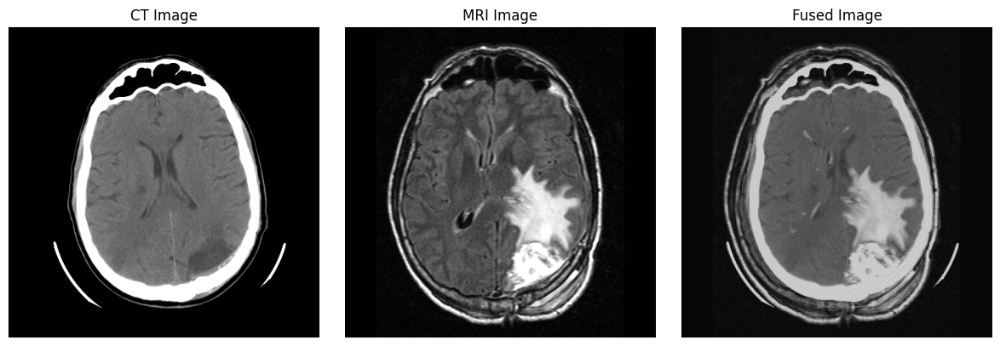

In [9]:
import matplotlib.pyplot as plt

# دالة لعرض الصورة المدمجة
def display_fused_image(ct_image, mri_image, fused_image):
    # عرض الصور
    plt.figure(figsize=(12, 4))

    # عرض صورة CT
    plt.subplot(1, 3, 1)
    plt.imshow(ct_image, cmap='gray')
    plt.title('CT Image')
    plt.axis('off')

    # عرض صورة MRI
    plt.subplot(1, 3, 2)
    plt.imshow(mri_image, cmap='gray')
    plt.title('MRI Image')
    plt.axis('off')

    # عرض الصورة المدمجة
    plt.subplot(1, 3, 3)
    plt.imshow(fused_image, cmap='gray')
    plt.title('Fused Image')
    plt.axis('off')

    # عرض الصورة
    plt.tight_layout()
    plt.show()

# بعد حساب الصور المدمجة
ct_image = ct_images[0]  # على سبيل المثال
mri_image = mri_images[0]  # على سبيل المثال
fused_dwt = fuse_images_dwt(ct_image, mri_image)
final_fused_image = inverse_dwt(fused_dwt)

# عرض الصور
display_fused_image(ct_image, mri_image, final_fused_image)


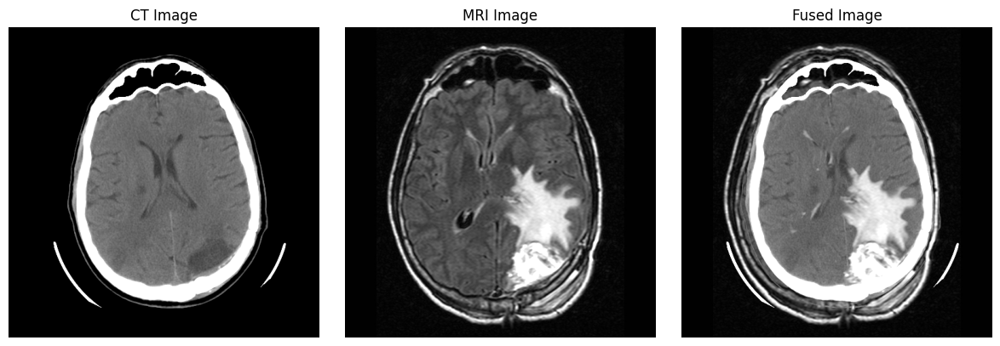

تم حفظ الصورة المدمجة 1 في fused_images/fused_image_1.png


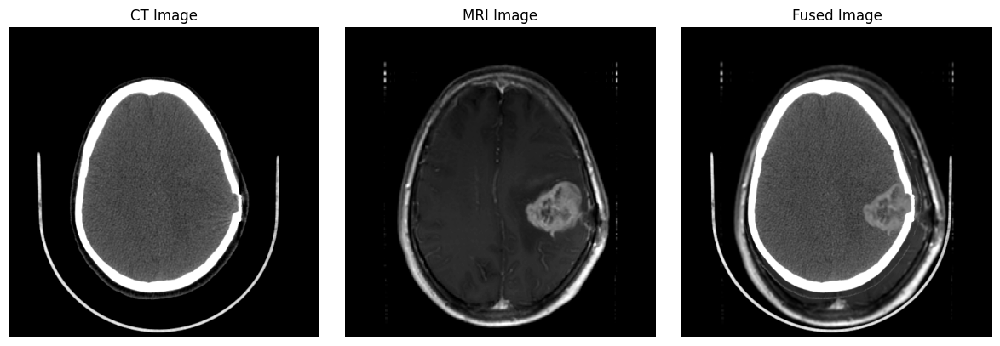

تم حفظ الصورة المدمجة 2 في fused_images/fused_image_2.png


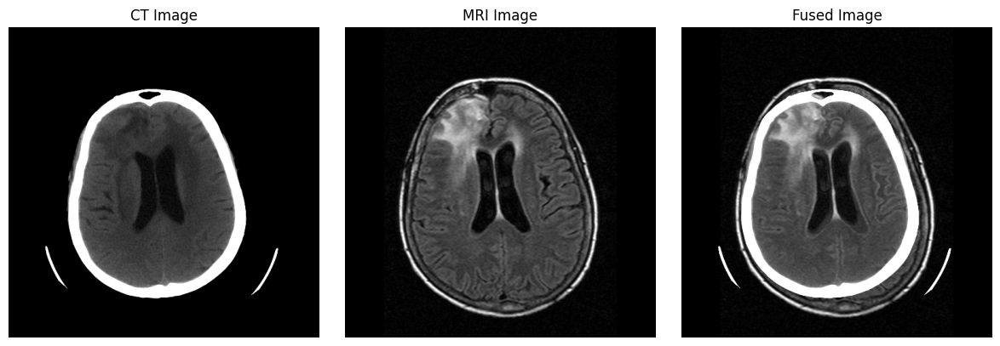

تم حفظ الصورة المدمجة 3 في fused_images/fused_image_3.png


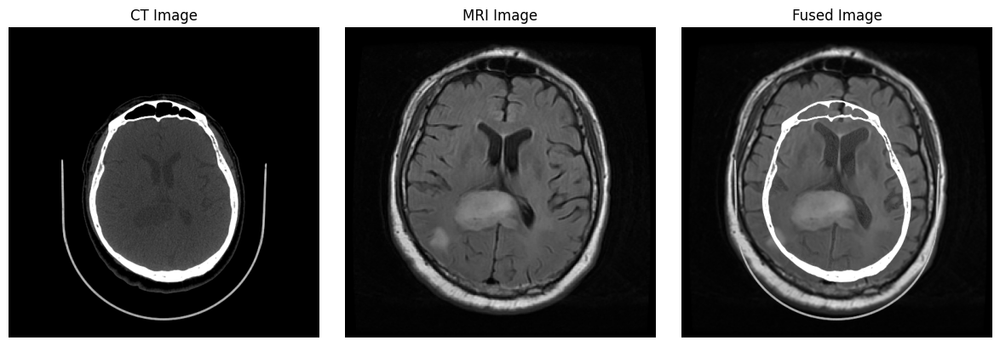

تم حفظ الصورة المدمجة 4 في fused_images/fused_image_4.png


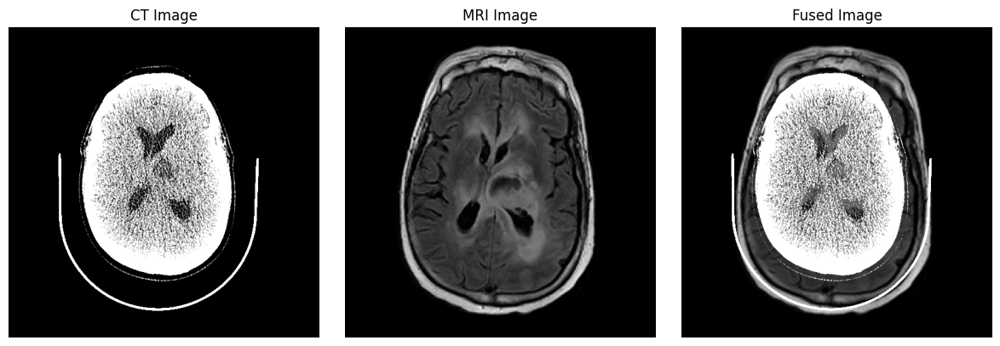

تم حفظ الصورة المدمجة 5 في fused_images/fused_image_5.png


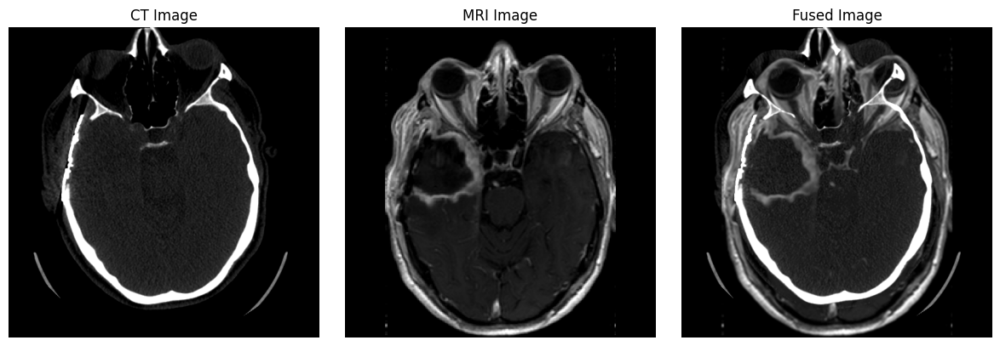

تم حفظ الصورة المدمجة 6 في fused_images/fused_image_6.png


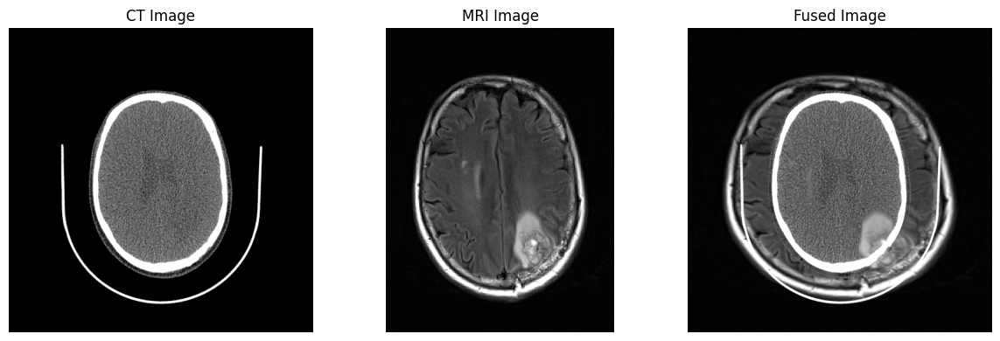

تم حفظ الصورة المدمجة 7 في fused_images/fused_image_7.png


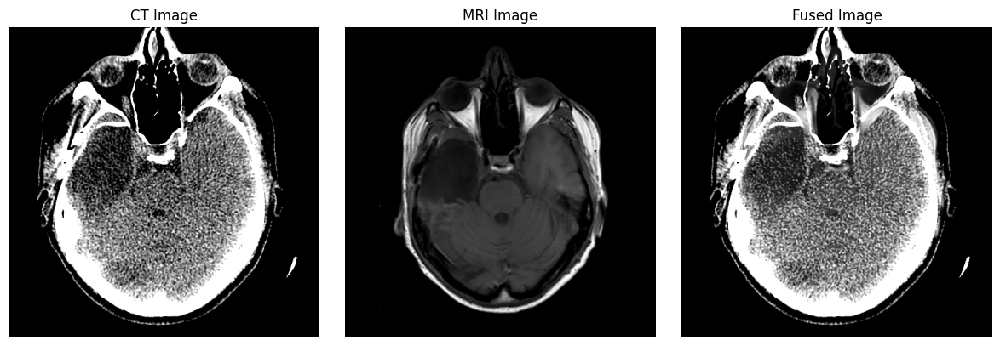

تم حفظ الصورة المدمجة 8 في fused_images/fused_image_8.png


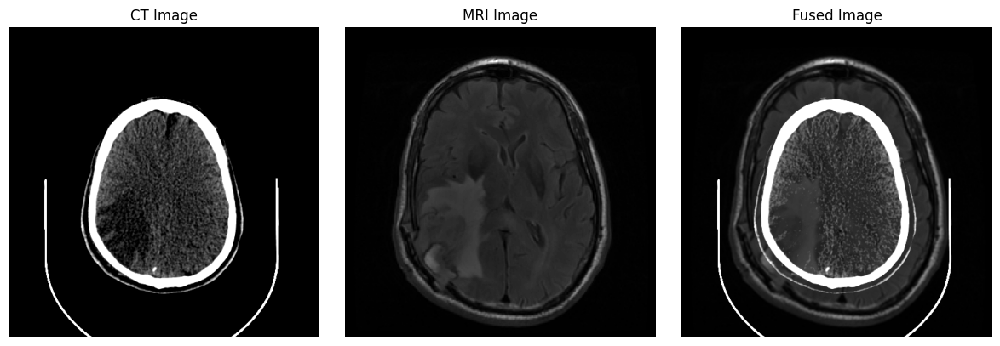

تم حفظ الصورة المدمجة 9 في fused_images/fused_image_9.png


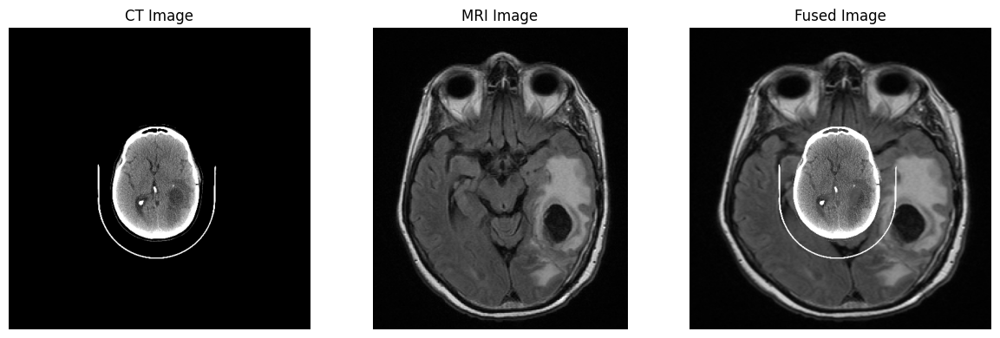

تم حفظ الصورة المدمجة 10 في fused_images/fused_image_10.png


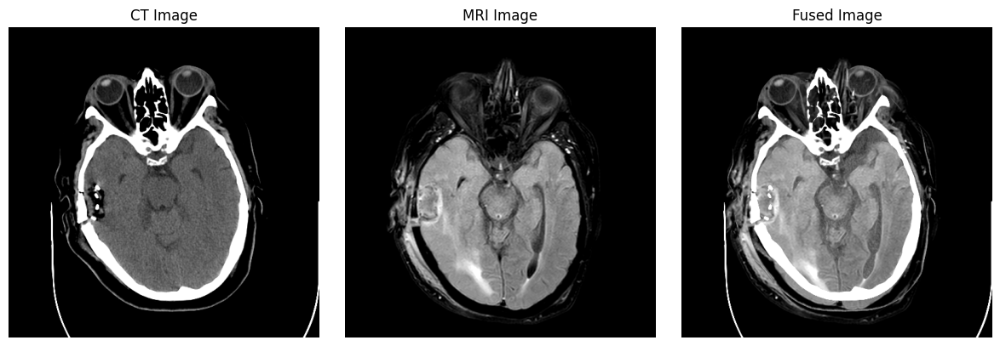

تم حفظ الصورة المدمجة 11 في fused_images/fused_image_11.png


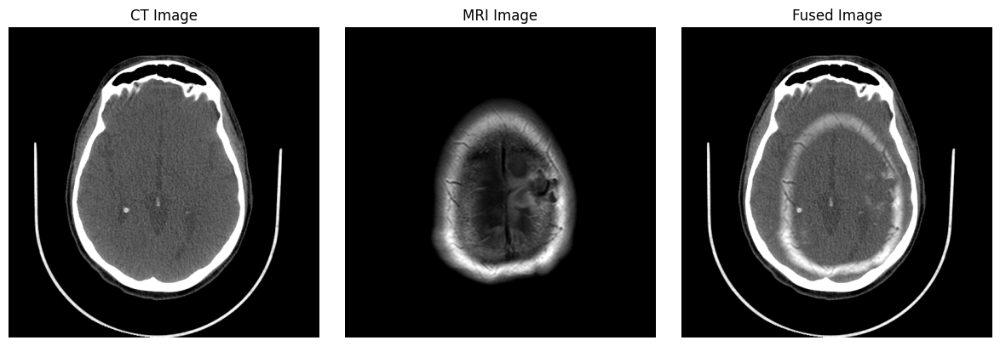

تم حفظ الصورة المدمجة 12 في fused_images/fused_image_12.png


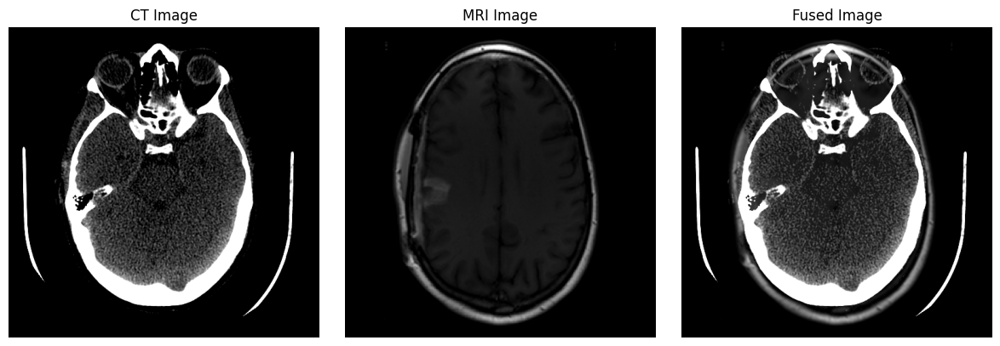

تم حفظ الصورة المدمجة 13 في fused_images/fused_image_13.png


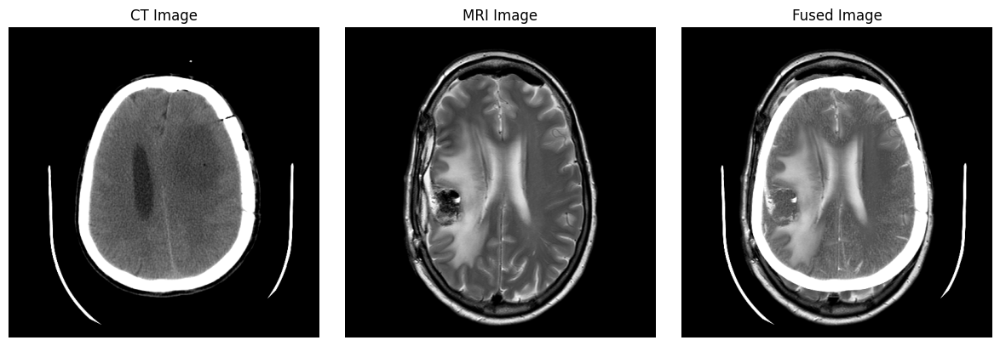

تم حفظ الصورة المدمجة 14 في fused_images/fused_image_14.png


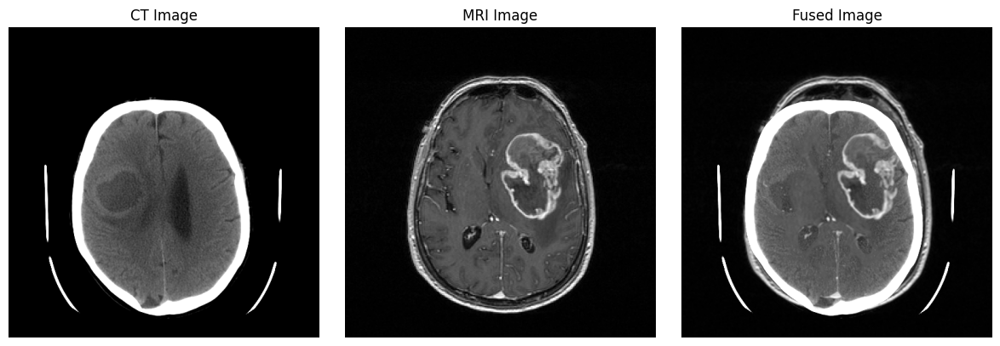

تم حفظ الصورة المدمجة 15 في fused_images/fused_image_15.png


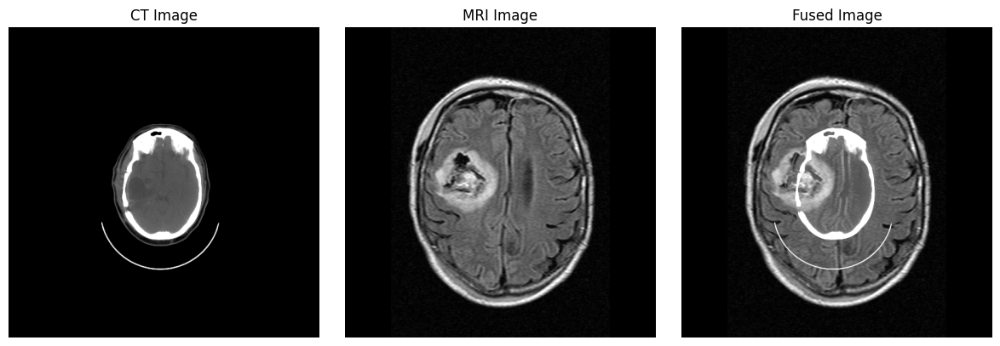

تم حفظ الصورة المدمجة 16 في fused_images/fused_image_16.png


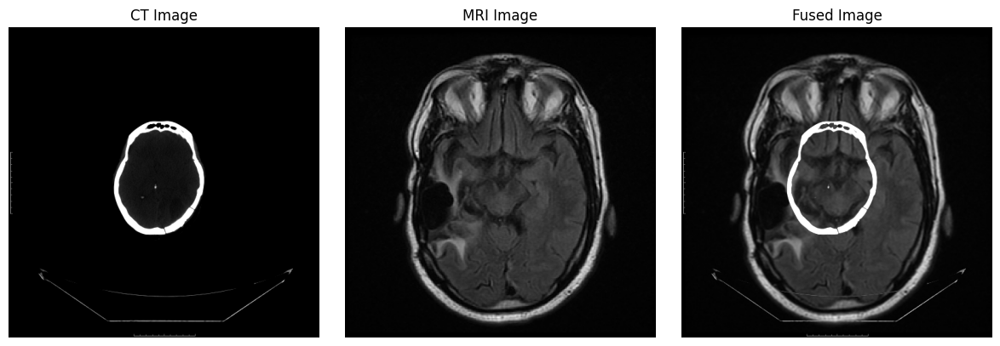

تم حفظ الصورة المدمجة 17 في fused_images/fused_image_17.png


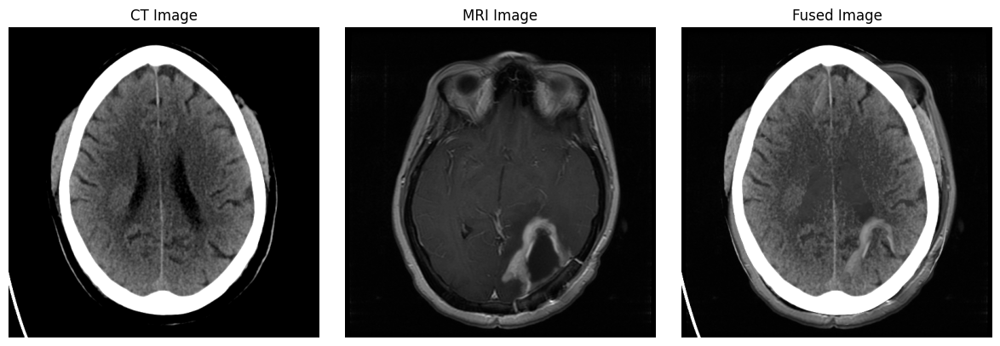

تم حفظ الصورة المدمجة 18 في fused_images/fused_image_18.png


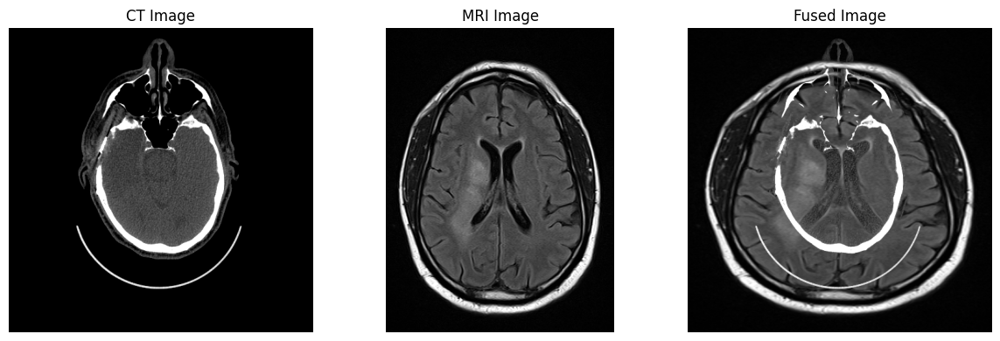

تم حفظ الصورة المدمجة 19 في fused_images/fused_image_19.png


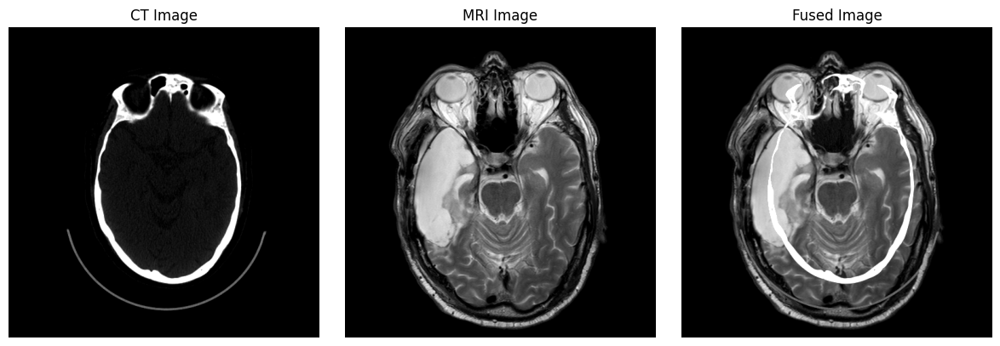

تم حفظ الصورة المدمجة 20 في fused_images/fused_image_20.png


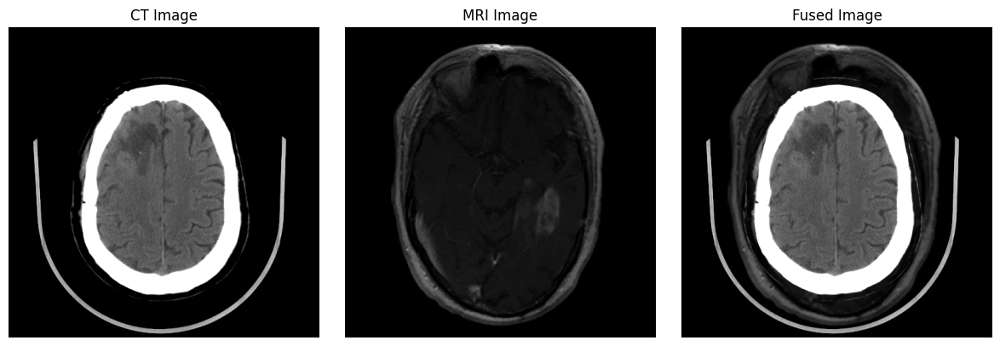

تم حفظ الصورة المدمجة 21 في fused_images/fused_image_21.png


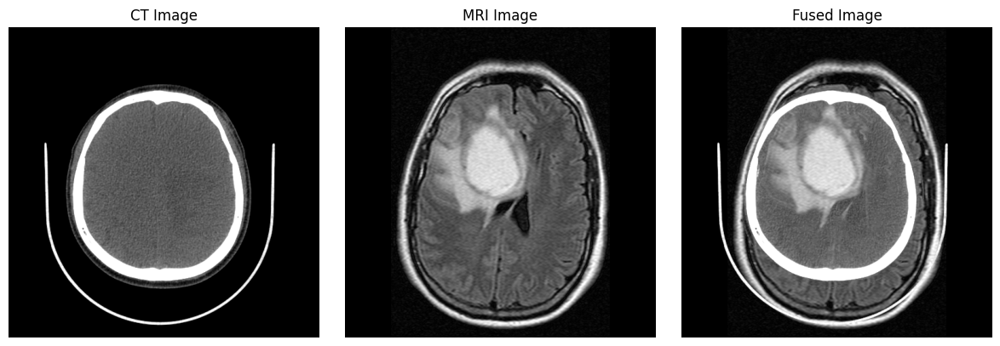

تم حفظ الصورة المدمجة 22 في fused_images/fused_image_22.png


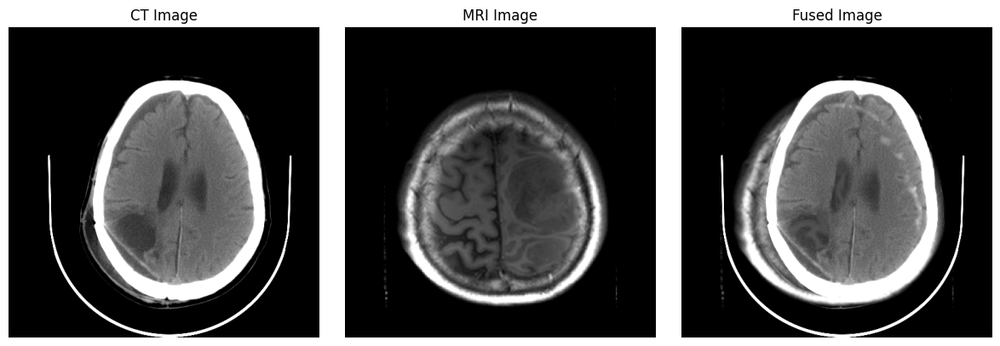

تم حفظ الصورة المدمجة 23 في fused_images/fused_image_23.png


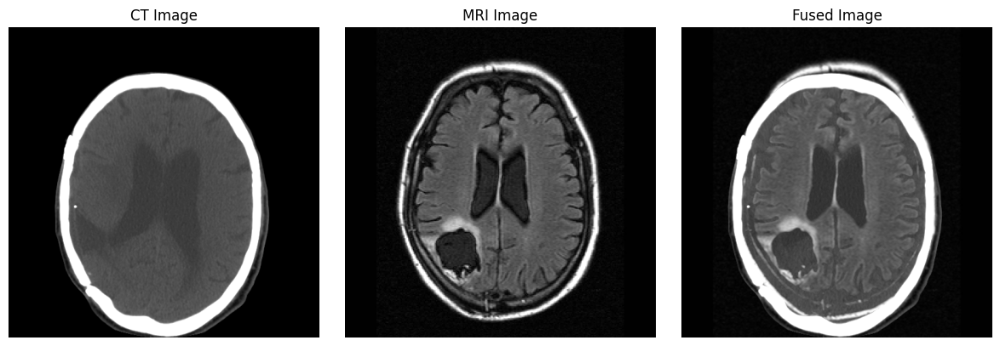

تم حفظ الصورة المدمجة 24 في fused_images/fused_image_24.png


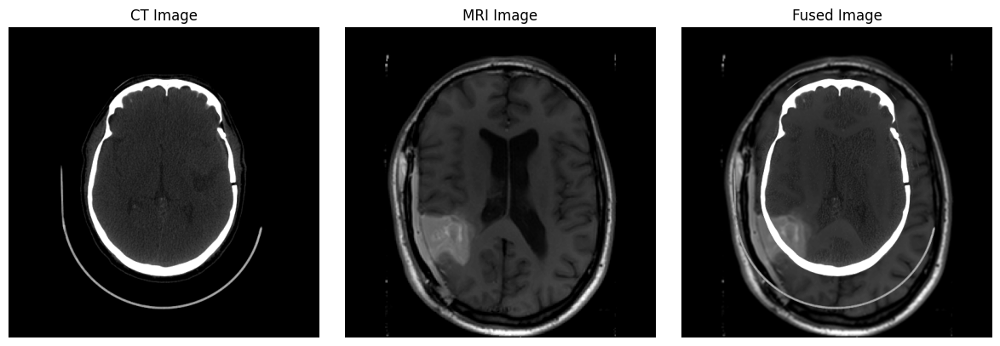

تم حفظ الصورة المدمجة 25 في fused_images/fused_image_25.png


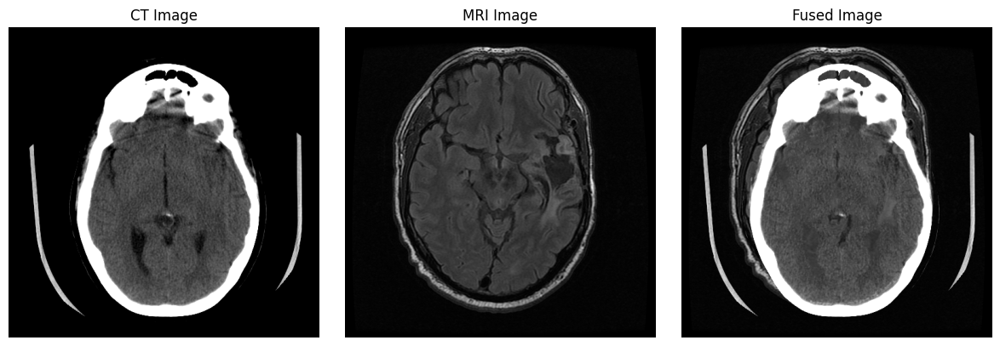

تم حفظ الصورة المدمجة 26 في fused_images/fused_image_26.png


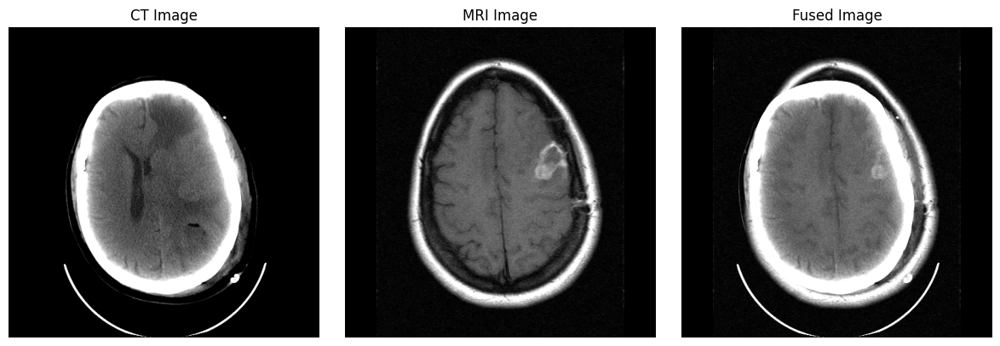

تم حفظ الصورة المدمجة 27 في fused_images/fused_image_27.png


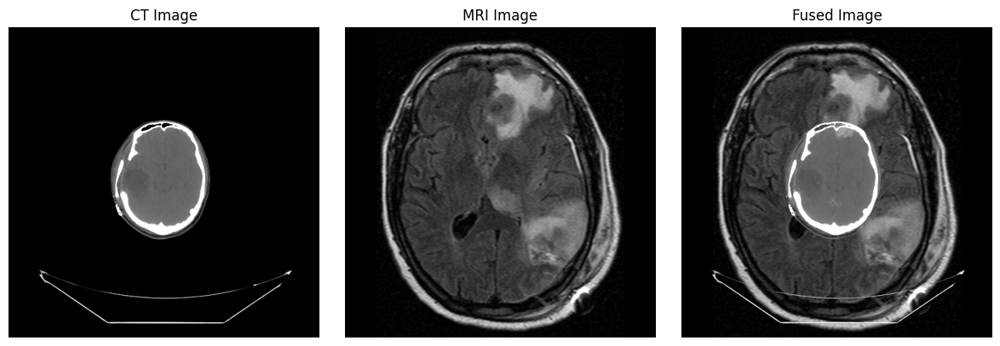

تم حفظ الصورة المدمجة 28 في fused_images/fused_image_28.png


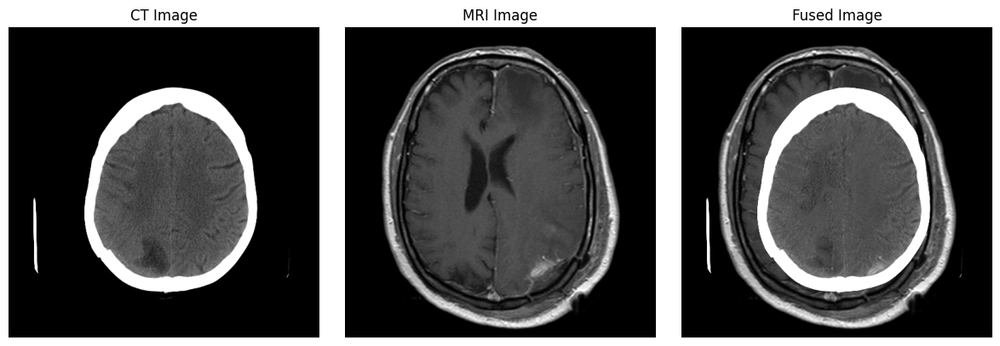

تم حفظ الصورة المدمجة 29 في fused_images/fused_image_29.png


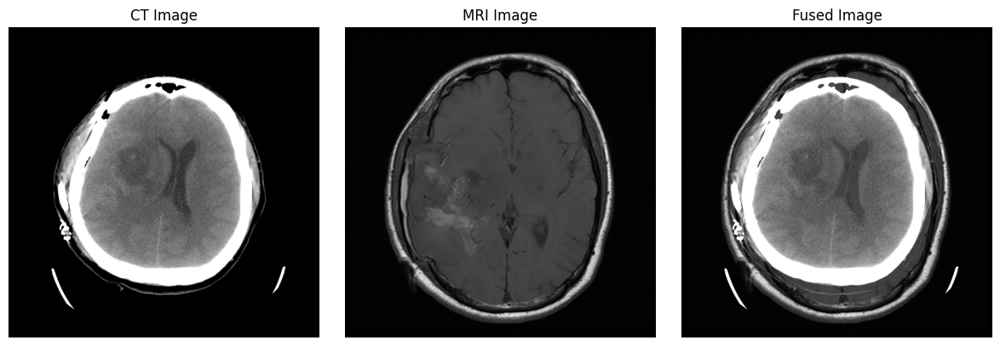

تم حفظ الصورة المدمجة 30 في fused_images/fused_image_30.png


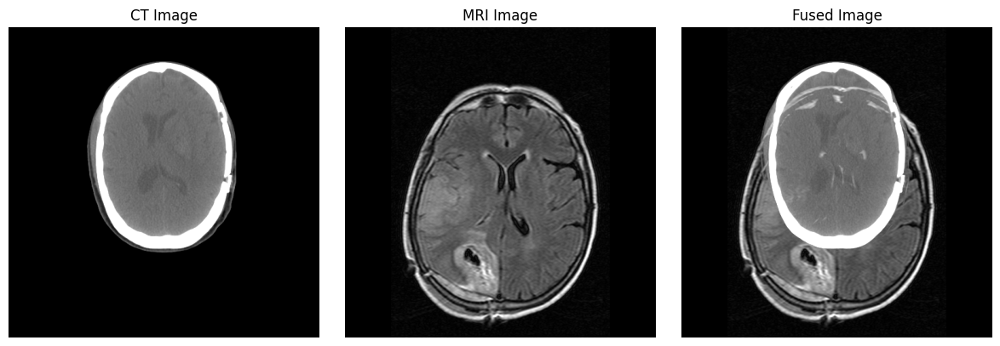

تم حفظ الصورة المدمجة 31 في fused_images/fused_image_31.png


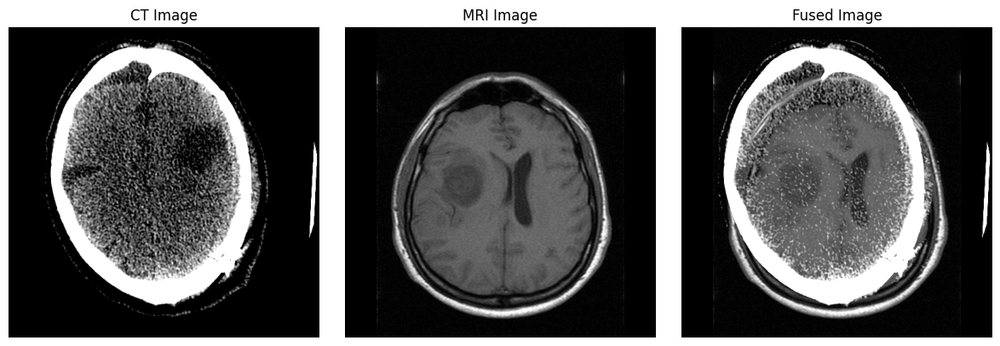

تم حفظ الصورة المدمجة 32 في fused_images/fused_image_32.png


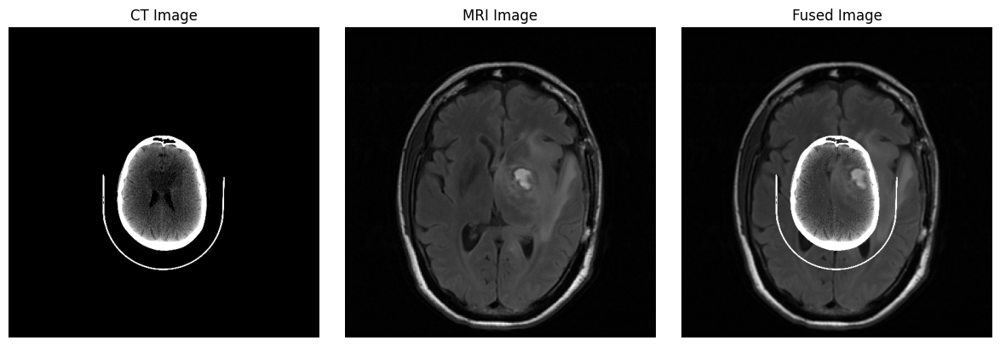

تم حفظ الصورة المدمجة 33 في fused_images/fused_image_33.png


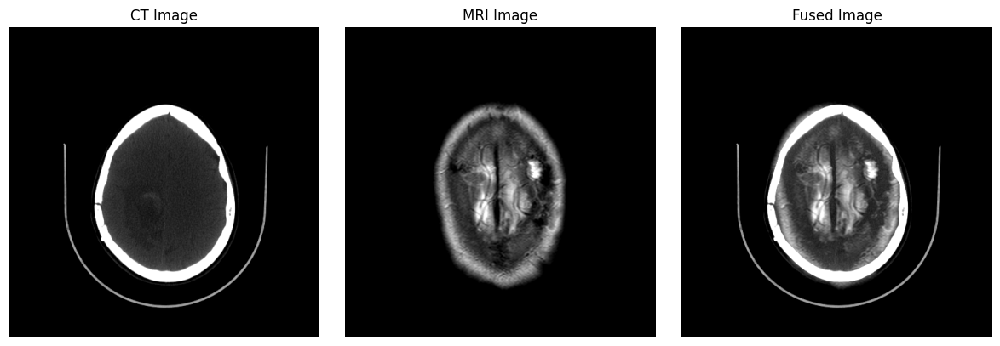

تم حفظ الصورة المدمجة 34 في fused_images/fused_image_34.png


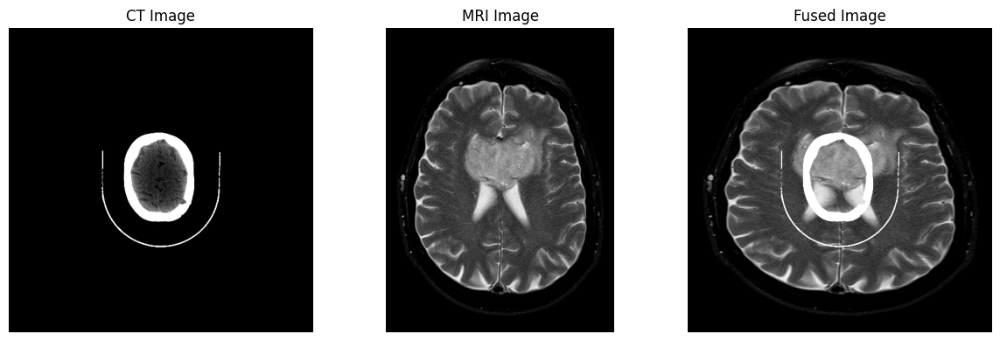

تم حفظ الصورة المدمجة 35 في fused_images/fused_image_35.png


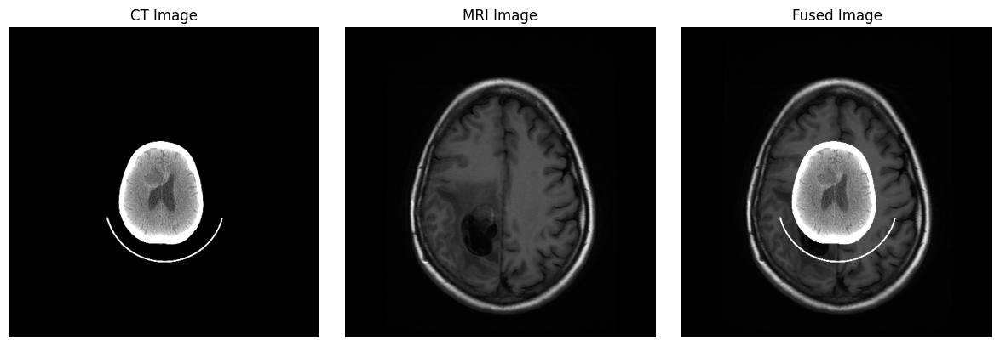

تم حفظ الصورة المدمجة 36 في fused_images/fused_image_36.png


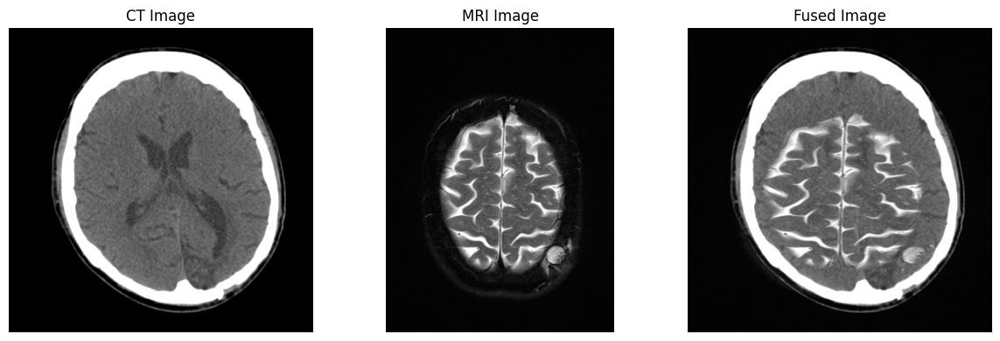

تم حفظ الصورة المدمجة 37 في fused_images/fused_image_37.png


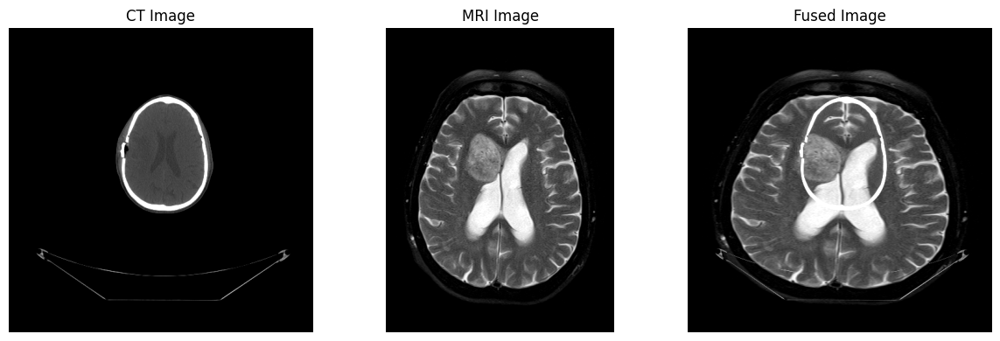

تم حفظ الصورة المدمجة 38 في fused_images/fused_image_38.png


In [12]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# دالة لتحميل جميع الصور من المجلدات الفرعية
def load_images_from_folders(main_folder):
    ct_images = []
    mri_images = []
    
    # استعراض جميع المجلدات الفرعية داخل المجلد الأساسي
    for root, dirs, files in os.walk(main_folder):
        for file in files:
            if 'ct' in file.lower():  # فرضًا أن صور CT تحتوي على "ct" في اسم الملف
                ct_image_path = os.path.join(root, file)
                ct_image = cv2.imread(ct_image_path, cv2.IMREAD_GRAYSCALE)
                if ct_image is not None:
                    ct_images.append(ct_image)
            elif 'mri' in file.lower():  # فرضًا أن صور MRI تحتوي على "mri" في اسم الملف
                mri_image_path = os.path.join(root, file)
                mri_image = cv2.imread(mri_image_path, cv2.IMREAD_GRAYSCALE)
                if mri_image is not None:
                    mri_images.append(mri_image)
    
    return ct_images, mri_images

# دالة لتغيير حجم الصورة إلى نفس حجم صورة CT
def resize_image_to_match(ct_image, mri_image):
    resized_mri_image = cv2.resize(mri_image, (ct_image.shape[1], ct_image.shape[0]))
    return resized_mri_image

# دالة لدمج الصور باستخدام تقنية DWT أو أي طريقة أخرى
def fuse_images_dwt(ct_image, mri_image):
    # تغيير حجم صورة MRI لتتناسب مع حجم صورة CT
    mri_image_resized = resize_image_to_match(ct_image, mri_image)
    
    # تطبيق DWT (أو أي تقنية دمج أخرى هنا)
    fused_image = np.maximum(ct_image, mri_image_resized)  # هنا يمكن استخدام أي خوارزمية دمج مثل DWT أو CWT
    
    return fused_image

# دالة لعرض الصورة المدمجة
def display_fused_image(ct_image, mri_image, fused_image):
    # عرض الصور
    plt.figure(figsize=(12, 4))

    # عرض صورة CT
    plt.subplot(1, 3, 1)
    plt.imshow(ct_image, cmap='gray')
    plt.title('CT Image')
    plt.axis('off')

    # عرض صورة MRI
    plt.subplot(1, 3, 2)
    plt.imshow(mri_image, cmap='gray')
    plt.title('MRI Image')
    plt.axis('off')

    # عرض الصورة المدمجة
    plt.subplot(1, 3, 3)
    plt.imshow(fused_image, cmap='gray')
    plt.title('Fused Image')
    plt.axis('off')

    # عرض الصورة
    plt.tight_layout()
    plt.show()

# تحميل الصور من المجلدات الفرعية
main_folder = '/kaggle/input/fusion/final data'  # استبدل بالمسار الفعلي للمجلد
ct_images, mri_images = load_images_from_folders(main_folder)

# التأكد من أن الصور تم تحميلها
if len(ct_images) == 0 or len(mri_images) == 0:
    print("لم يتم العثور على صور CT أو MRI.")
else:
    # دمج جميع الصور واحدة تلو الأخرى
    output_folder = 'fused_images'
    os.makedirs(output_folder, exist_ok=True)

    for i, (ct_image, mri_image) in enumerate(zip(ct_images, mri_images)):
        # دمج الصور
        fused_image = fuse_images_dwt(ct_image, mri_image)

        # عرض الصور المدمجة
        display_fused_image(ct_image, mri_image, fused_image)

        # حفظ الصورة المدمجة
        output_path = os.path.join(output_folder, f'fused_image_{i+1}.png')
        cv2.imwrite(output_path, fused_image)
        print(f"تم حفظ الصورة المدمجة {i+1} في {output_path}")


In [15]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from math import log10, sqrt

# دالة لتحميل الصور من جميع المجلدات الفرعية داخل المجلدات الرئيسية
def load_images_from_nested_folders(main_folder, image_type):
    images = []
    for root, dirs, files in os.walk(main_folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif')) and image_type in file.lower():
                image_path = os.path.join(root, file)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if image is not None:
                    images.append(image)
    return images

# دالة لتغيير حجم الصور
def resize_image_to_match(image1, image2):
    resized_image = cv2.resize(image2, (image1.shape[1], image1.shape[0]))
    return resized_image

# دالة لحساب PSNR
def calculate_psnr(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * log10(255.0 / sqrt(mse))

# دالة لحساب MI
def calculate_mi(image1, image2):
    hist_2d, _, _ = np.histogram2d(image1.ravel(), image2.ravel(), bins=20)
    hist_2d /= hist_2d.sum()
    joint_entropy = -np.sum(hist_2d * np.log2(hist_2d + 1e-10))
    entropy1 = -np.sum(np.histogram(image1.ravel(), bins=20, density=True)[0] * np.log2(np.histogram(image1.ravel(), bins=20, density=True)[0] + 1e-10))
    entropy2 = -np.sum(np.histogram(image2.ravel(), bins=20, density=True)[0] * np.log2(np.histogram(image2.ravel(), bins=20, density=True)[0] + 1e-10))
    return entropy1 + entropy2 - joint_entropy

# دالة لحساب المعايير لكل صورة
def calculate_metrics(ct_image, mri_image, fused_image):
    metrics = {}
    
    # تغيير حجم الصور
    mri_image_resized = resize_image_to_match(ct_image, mri_image)

    # حساب SSIM
    metrics['SSIM_CT'] = ssim(ct_image, fused_image)
    metrics['SSIM_MRI'] = ssim(mri_image_resized, fused_image)

    # حساب PSNR
    metrics['PSNR_CT'] = calculate_psnr(ct_image, fused_image)
    metrics['PSNR_MRI'] = calculate_psnr(mri_image_resized, fused_image)

    # حساب MSE
    metrics['MSE_CT'] = np.mean((ct_image - fused_image) ** 2)
    metrics['MSE_MRI'] = np.mean((mri_image_resized - fused_image) ** 2)

    # حساب MI
    metrics['MI_CT'] = calculate_mi(ct_image, fused_image)
    metrics['MI_MRI'] = calculate_mi(mri_image_resized, fused_image)

    # حساب الإحصائيات الأخرى
    metrics['Mean_Intensity_Fused'] = np.mean(fused_image)
    metrics['Std_Dev_Fused'] = np.std(fused_image)
    metrics['Entropy_Fused'] = -np.sum(np.histogram(fused_image.ravel(), bins=256, density=True)[0] * 
                                       np.log2(np.histogram(fused_image.ravel(), bins=256, density=True)[0] + 1e-10))

    return metrics

# تحميل الصور
main_folder = '/kaggle/input/fusion/final data'
ct_images = load_images_from_nested_folders(main_folder, 'ct')
mri_images = load_images_from_nested_folders(main_folder, 'mri')

# التأكد من أن الصور تم تحميلها
if len(ct_images) == 0 or len(mri_images) == 0:
    print("لم يتم العثور على صور CT أو MRI.")
else:
    all_metrics = []
    output_folder = 'fused_images'
    os.makedirs(output_folder, exist_ok=True)
    
    for i, (ct_image, mri_image) in enumerate(zip(ct_images, mri_images)):
        # دمج الصور (يمكن استخدام أي طريقة دمج هنا)
        mri_image_resized = resize_image_to_match(ct_image, mri_image)
        fused_image = np.maximum(ct_image, mri_image_resized)
        
        # حساب المعايير
        metrics = calculate_metrics(ct_image, mri_image, fused_image)
        all_metrics.append(metrics)
        
        # حفظ الصورة المدمجة
        output_path = os.path.join(output_folder, f'fused_image_{i+1}.png')
        cv2.imwrite(output_path, fused_image)
        print(f"تم حفظ الصورة المدمجة {i+1} في {output_path}")

    # طباعة النتائج
    for idx, metric in enumerate(all_metrics, 1):
        print(f"\nMetrics for Image Pair {idx}:")
        for key, value in metric.items():
            print(f"{key}: {value:.4f}")



تم حفظ الصورة المدمجة 1 في fused_images/fused_image_1.png
تم حفظ الصورة المدمجة 2 في fused_images/fused_image_2.png
تم حفظ الصورة المدمجة 3 في fused_images/fused_image_3.png
تم حفظ الصورة المدمجة 4 في fused_images/fused_image_4.png
تم حفظ الصورة المدمجة 5 في fused_images/fused_image_5.png
تم حفظ الصورة المدمجة 6 في fused_images/fused_image_6.png
تم حفظ الصورة المدمجة 7 في fused_images/fused_image_7.png
تم حفظ الصورة المدمجة 8 في fused_images/fused_image_8.png
تم حفظ الصورة المدمجة 9 في fused_images/fused_image_9.png
تم حفظ الصورة المدمجة 10 في fused_images/fused_image_10.png
تم حفظ الصورة المدمجة 11 في fused_images/fused_image_11.png
تم حفظ الصورة المدمجة 12 في fused_images/fused_image_12.png
تم حفظ الصورة المدمجة 13 في fused_images/fused_image_13.png
تم حفظ الصورة المدمجة 14 في fused_images/fused_image_14.png
تم حفظ الصورة المدمجة 15 في fused_images/fused_image_15.png
تم حفظ الصورة المدمجة 16 في fused_images/fused_image_16.png
تم حفظ الصورة المدمجة 17 في fused_images/fused_image_17.pn